In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
from astropy.io import fits

In [2]:
from matplotlib.colors import TwoSlopeNorm
from matplotlib import colors

In [3]:
import muram as mio

In [4]:
muramdir = '/dat/milic/MURaM_400G_plage_pore/3D/'

In [4]:
muramdir = '/dat/milic/muram_from_rebecca/'

In [5]:
iter = 63000

In [5]:
iter = 20000

In [6]:
temp = mio.MuramCube(muramdir,iter,'Temp')

In [6]:
temp.shape

(480, 1536, 1536)

In [7]:
temp = temp.transpose(1,2,0)

In [8]:
temp.shape

(1536, 1536, 480)

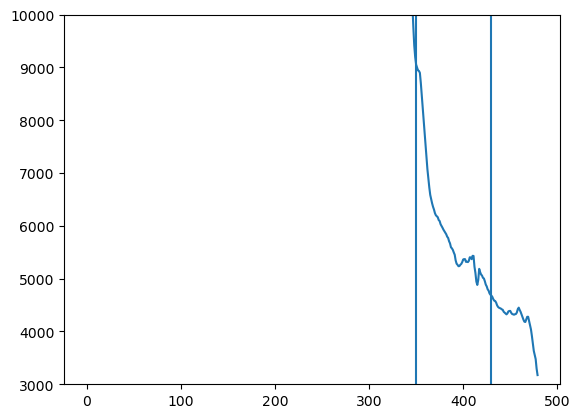

In [27]:
plt.plot(temp[323,195,:])
plt.ylim(3000,10000)
plt.axvline(350)
plt.axvline(430)

In [8]:
plt.figure(figsize=[9,8])
plt.imshow(temp[:600,:600,360].T,cmap='magma',origin='lower')
plt.colorbar()
plt.plot(323,190,marker='x')

Error in callback <function flush_figures at 0x7f8e7795b7f0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

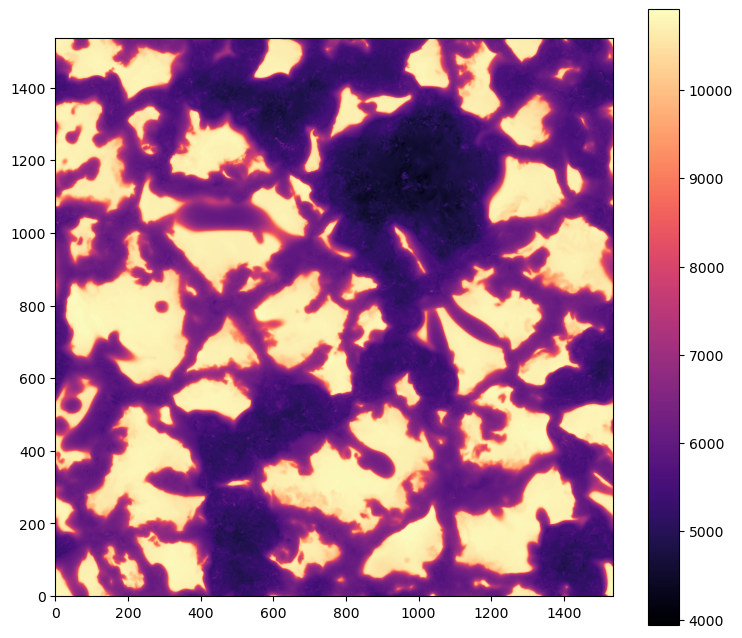

In [9]:
plt.figure(figsize=[9,8])
plt.imshow(temp[:,:,800].T,cmap='magma',origin='lower')
plt.colorbar()

In [18]:
z_total = temp.shape[2]*6
print (z_total)

6336


In [33]:
from astropy.io import fits

In [26]:
Qres = mio.MuramCube(muramdir, iter, 'Qres')
Qres = Qres.transpose(1,2,0)

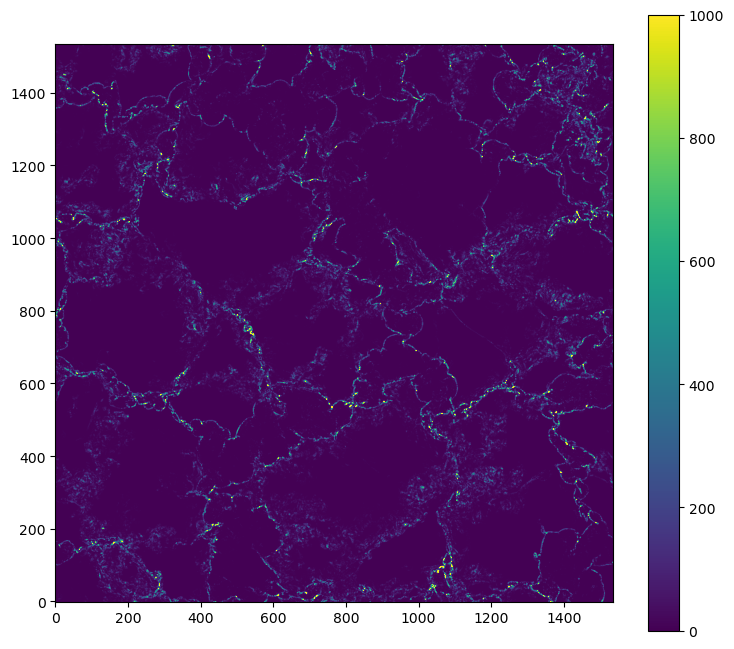

In [31]:
plt.figure(figsize=[9,8])
plt.imshow(Qres[:,:,805].T,origin='lower',vmax=1e3)
plt.colorbar()

In [6]:
vz = mio.MuramCube(muramdir, iter, 'vx')
vz = vz.transpose(1,2,0)


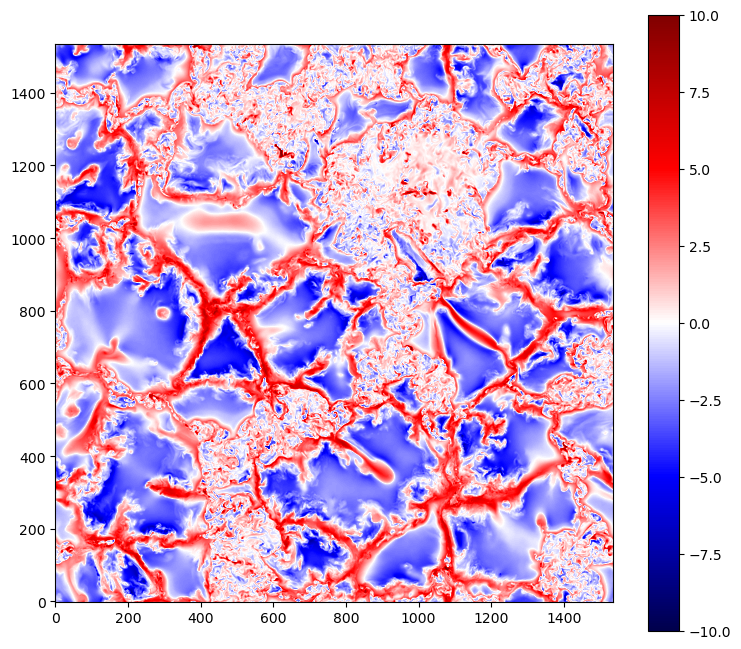

In [7]:
plt.figure(figsize=[9,8])
plt.imshow(-vz[:,:,805].T/1E5,cmap='seismic',origin='lower', vmin=-10,vmax=10)
plt.colorbar()

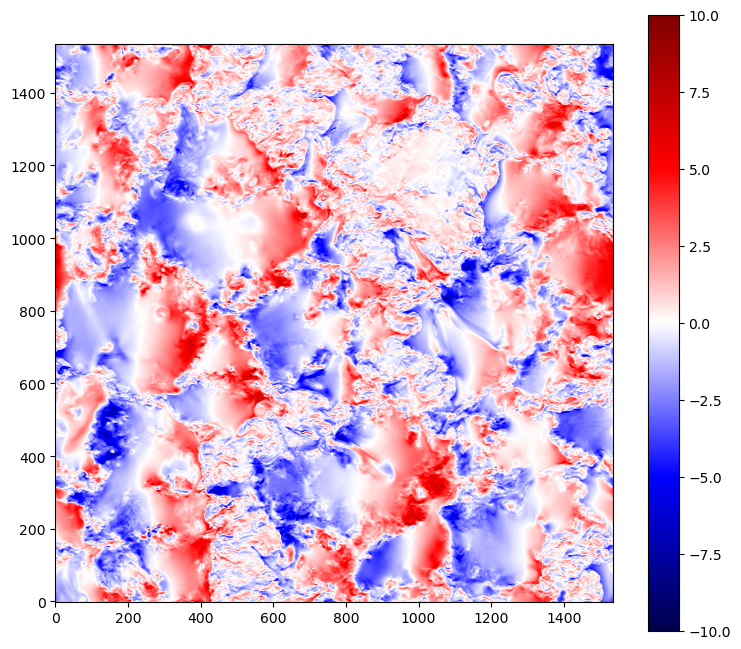

In [8]:
vx = mio.MuramCube(muramdir, iter, 'vy')
vx = vx.transpose(1,2,0)
plt.figure(figsize=[9,8])
plt.imshow(vx[:,:,805].T/1E5,cmap='seismic',origin='lower', vmin=-10,vmax=10)
plt.colorbar()


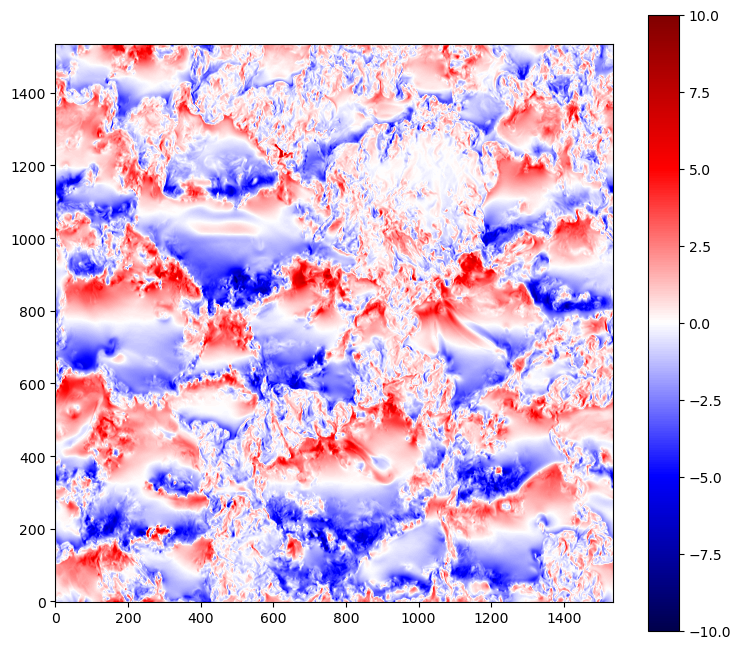

In [9]:
vy = mio.MuramCube(muramdir, iter, 'vz')
vy = vy.transpose(1,2,0)
plt.figure(figsize=[9,8])
plt.imshow(vy[:,:,805].T/1E5,cmap='seismic',origin='lower', vmin=-10,vmax=10)
plt.colorbar()

In [83]:
iter = 10000

In [13]:
Bz = mio.MuramCube(muramdir, iter, 'Bx')
Bz = Bz.transpose(1,2,0)*np.sqrt(4*np.pi)

In [14]:
Bx = mio.MuramCube(muramdir, iter, 'By')
Bx = Bx.transpose(1,2,0)*np.sqrt(4*np.pi)

In [15]:
By = mio.MuramCube(muramdir, iter, 'Bz')
By = By.transpose(1,2,0)*np.sqrt(4*np.pi)

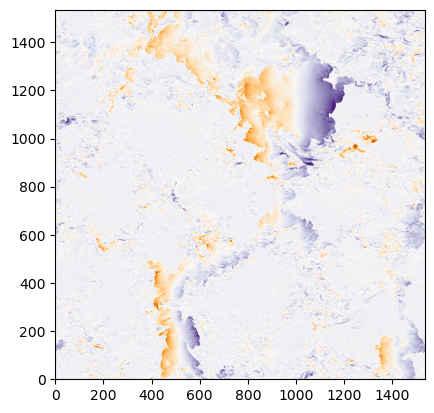

In [16]:
plt.imshow(Bx[:,:,780].T,origin='lower',cmap='PuOr')

In [19]:
tau_common = np.linspace(-3,1,41)
Bz_interp = np.zeros((1536,1536,41))
for i in range(1536):
    for j in range(1536):
        Bz_interp[i,j,:] = np.interp(tau_common,np.log10(tau[i,j,::-1]),Bz[i,j,::-1])

Text(0.5, 1.0, '$\\log\\tau =-2$')

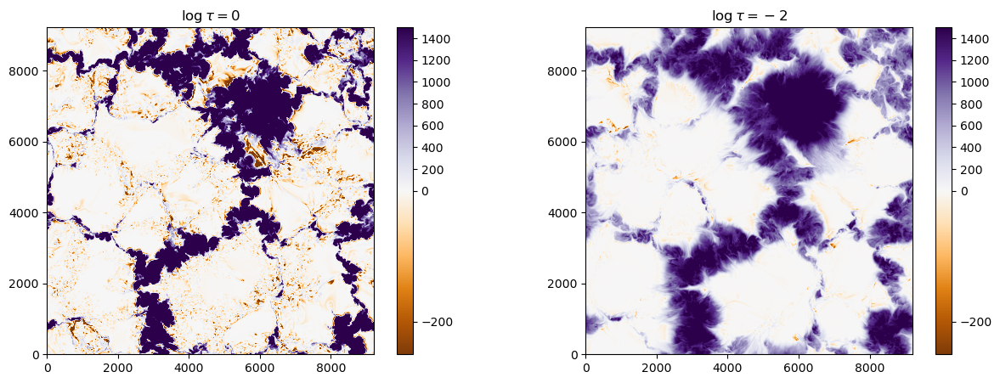

In [20]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz_interp[:,:,30].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bz_interp[:,:,10].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

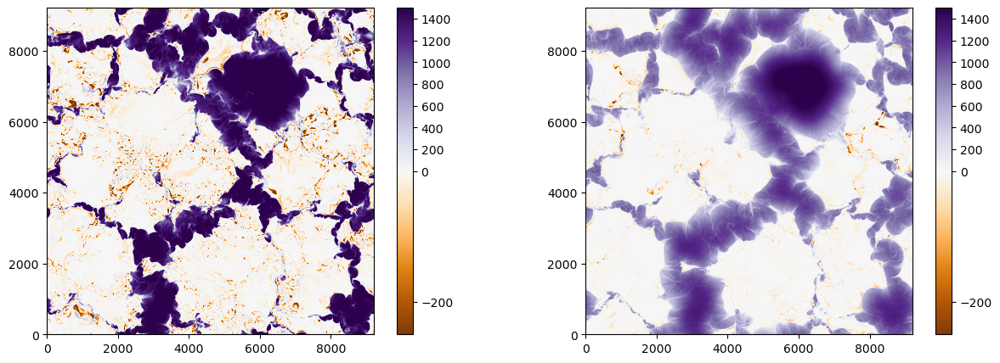

In [102]:

plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,805].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz[:,:,835].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500),extent=[0,1536*6,0,1536*6])
plt.colorbar()

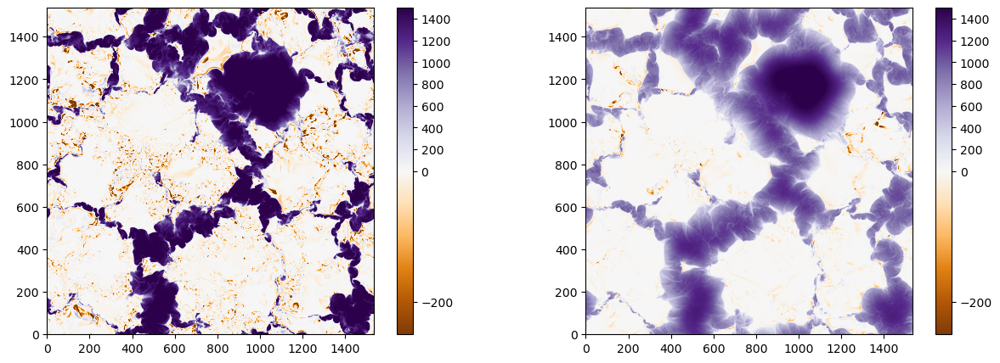

In [103]:

plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,805].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500))
plt.colorbar()
plt.subplot(122)
plt.imshow(Bz[:,:,835].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=1500))
plt.colorbar()

(2500.0, 6500.0)

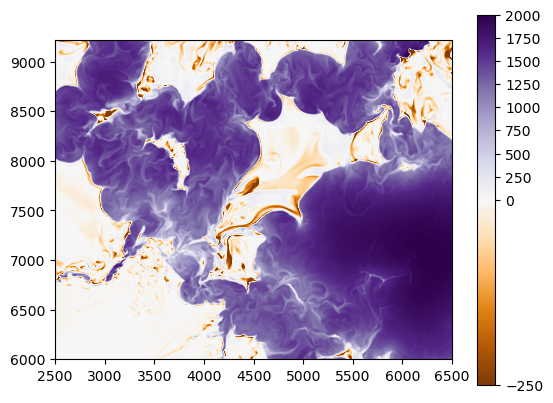

In [109]:
plt.imshow(Bz[:,:,805].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.ylim(bottom=6000)
plt.xlim(2500,6500)

In [26]:
print(np.sum(Bz[:,:,385]))
print(np.sum(Bz[:,:,400]))

19971810.0
19971802.0


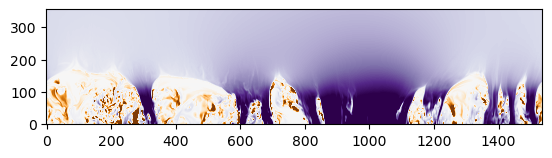

In [23]:
plt.imshow(Bz[:,1250,700:].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-250,vcenter=0,vmax=2000))

In [62]:
385*16

6160

In [8]:
z = np.arange(temp.shape[2]) *6

In [13]:
Tmean = np.mean(temp,axis=(0,1))

In [ ]:
np.argwhere(temp[:,:,])

(3000.0, 10000.0)

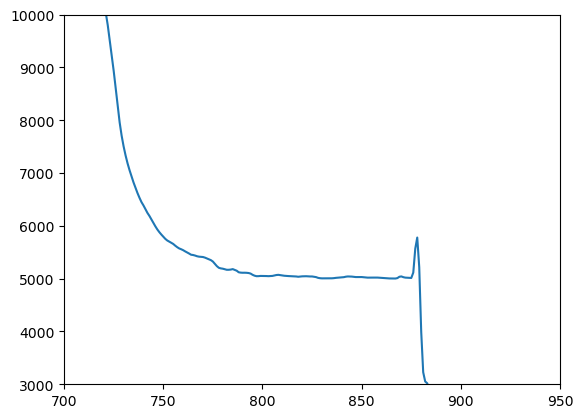

In [16]:
plt.plot(z/6, temp[500,100,:])
plt.xlim([700,950])
plt.ylim([3000,10000])

(3000.0, 10000.0)

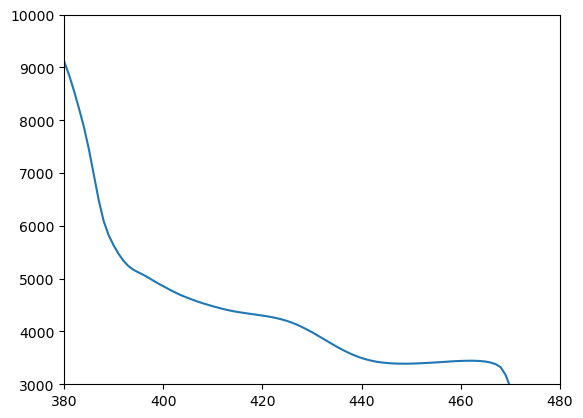

In [16]:
plt.plot(z/6, Tmean)
plt.xlim(380,480)
plt.ylim(3000,10000)

(3000.0, 10000.0)

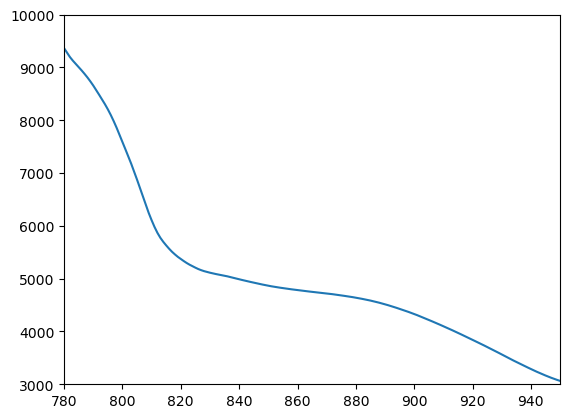

In [63]:
plt.plot(z/6, Tmean)
plt.xlim([780,950])
plt.ylim([3000,10000])

In [14]:
tau = mio.MuramCube(muramdir, iter, 'tau')
tau = tau.transpose(1,2,0)

FileNotFoundError: [Errno 2] No such file or directory: '/dat/milic/muram_from_rebecca/tau.063000'

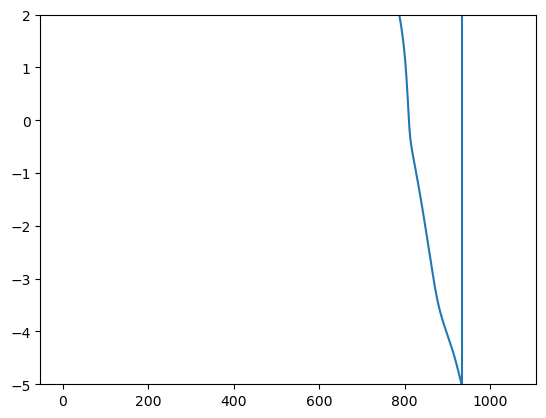

In [126]:
plt.plot(z/6,np.log10(np.mean(tau,axis=(0,1))))
plt.ylim(-5,2)
plt.axvline(935)
#plt.axhline(0)


In [17]:
# gde je 16200
np.argmin(np.abs(z-6200))

387

In [8]:
temp = temp.transpose(1,2,0)
temp.shape

(1536, 1536, 480)

In [28]:
high = np.where(temp[:,:,-100:] > 22000.0)

In [29]:
high = np.asarray(high)

In [30]:
high.shape

(3, 1291)

In [32]:
high[:,0]

array([133, 543,  87])

In [94]:
hl = 360
hh = 430
xl = 100
xh = 101
yl = 50
yh = 51

In [95]:
atmos = np.zeros([12,xh-xl,yh-yl,hh-hl])
atmos.shape

(12, 1, 1, 70)

In [96]:
atmos[2,:,:,:] = temp[hl:hh,xl:xh,yl:yh].transpose(1,2,0)
del(temp)

In [97]:
P = mio.MuramCube(muramdir, iter, 'P')
atmos[3,:,:,:] = P[hl:hh,xl:xh,yl:yh].transpose(1,2,0)
del(P)

In [98]:
vx = mio.MuramCube(muramdir, iter, 'vx')
atmos[9,:,:,:] = vx[hl:hh,xl:xh,yl:yh].transpose(1,2,0)
del(vx)


In [99]:
Bxtemp = mio.MuramCube(muramdir, iter, 'Bx')
Bx = Bxtemp[hl:hh,xl:xh,yl:yh].transpose(1,2,0)*np.sqrt(4*np.pi)
del(Bxtemp)
Bytemp = mio.MuramCube(muramdir, iter, 'By')
By = Bytemp[hl:hh,xl:xh,yl:yh].transpose(1,2,0)*np.sqrt(4*np.pi)
del(Bytemp)
Bztemp = mio.MuramCube(muramdir, iter, 'Bz')
Bz = Bztemp[hl:hh,xl:xh,yl:yh].transpose(1,2,0)*np.sqrt(4*np.pi)
del(Bztemp)

Bx[:,:,:] = 500.0 / 1.41
By[:,:,:] = 500.0 / 1.41
Bz[:,:,:] = 500.0


In [100]:
atmos[7,:,:,:] = np.sqrt(Bx**2.0 + By**2.0 + Bz**2.0)

In [101]:
atmos[10,:,:,:] = np.arccos(Bx/atmos[7,:,:,:])

In [102]:
atmos[11,:,:,:] = np.arctan(Bz/By)

In [103]:
h = np.linspace(0,(hh-hl-1)*16.*1E5,hh-hl)

In [104]:
atmos[1,:,:,:] = h[None,None,:]

In [105]:
atmos = atmos.astype("float32")

In [106]:
print(atmos.shape)
atmos = atmos.reshape(12,70)
np.savetxt("granule_500_500G.dat",atmos[:,::-1].T,fmt="%1.5e")

(12, 1, 1, 70)


In [ ]:
import pyana

In [ ]:
pyana.fzwrite("muram_pole_1.f0",atmos[:,:300,:,:],0,'temp')

In [ ]:
pyana.fzwrite("muram_pole_2.f0",atmos[:,300:,:,:],0,'temp')

In [ ]:
plt.figure(figsize=[9.5,8])
plt.imshow(atmos[2,:,:,-1].T,origin='lower')
plt.colorbar()

### Convert to SIR format: 

In [5]:
temp = mio.MuramCube(muramdir, iter, 'T')

In [6]:
hl = 350
hh = 430
xl = 0
xh = 1536
yl = 0
yh = 1536

In [7]:
atmos = np.zeros([11,hh-hl,xh-xl,yh-yl])

In [8]:
tau = np.linspace(4.0,-5.0,hh-hl)

In [9]:
atmos[0,:,:,:] = tau[:,None,None]

In [10]:
atmos[1,:,:,:] = np.copy(temp[hl:hh,xh:xl,yh:yl])
del(temp)

In [11]:
#modelin[2,:,kk,jj] = Pgas[:, jj, kk]/10.
#modelin[3,:,kk,jj] = zeroarr[:]
#modelin[4,:,kk,jj] = B[:, jj, kk]
#modelin[5,:,kk,jj] = vlos[:, jj, kk]
#modelin[6,:,kk,jj] = incl[:, jj, kk]
#modelin[7,:,kk,jj] = azi[:, jj, kk]
#modelin[8,:,kk,jj] = height[:]
#modelin[9,:,kk,jj] = Pgas[:, jj, kk]
#modelin[10,:,kk,jj] = zeroarr[:]

In [12]:
P = mio.MuramCube(muramdir, iter, 'P')
atmos[3,:,:,:] = P[hl:hh,xl:xh,yl:yh] * 0.1
atmos[9,:,:,:] = P[hl:hh,xl:xh,yl:yh]
del(P)

In [13]:
    # vx is actually vlos
    vlos = mio.MuramCube(muramdir, iter, 'vx')
    atmos[5,:,:,:] = vlos[hl:hh,xl:xh,yl:yh]
    del(vlos)

In [14]:
# Now B: 
Bxtemp = mio.MuramCube(muramdir, iter, 'Bx')
Bx = Bxtemp[hl:hh,xl:xh,yl:yh]*np.sqrt(4*np.pi)
del(Bxtemp)
Bytemp = mio.MuramCube(muramdir, iter, 'By')
By = Bytemp[hl:hh,xl:xh,yl:yh]*np.sqrt(4*np.pi)
del(Bytemp)
Bztemp = mio.MuramCube(muramdir, iter, 'Bz')
Bz = Bztemp[hl:hh,xl:xh,yl:yh]*np.sqrt(4*np.pi)
del(Bztemp)

In [ ]:
atmos[4,:,:,:] = np.sqrt(Bx**2.0 + By**2.0 + Bz**2.0)
atmos[6,:,:,:] = np.arccos(Bx/atmos[7,:,:,:])
atmos[7,:,:,:] = np.arctan(Bz/By)

In [13]:
data2 = np.fromfile("X:\\xenosh\\Full_simulation\\temp.float", dtype = np.float32)
data2.shape

(4294967296,)

In [8]:
data = np.fromfile("X:\\xenosh\\Full_simulation\\temp.float", dtype=float, sep='')
data.shape

(2147483648,)

In [9]:
4096*256*4096

4294967296

In [14]:
data1 = data2.reshape(4096,256,4096)
data1.shape

(4096, 256, 4096)

In [15]:
data1 = data1.transpose(0,2,1)
data1.shape

(4096, 4096, 256)

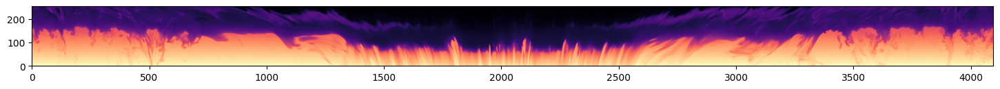

In [45]:
plt.figure(figsize=[18,20])
plt.imshow(data1[:,2000,:].T,origin='lower',cmap='magma')

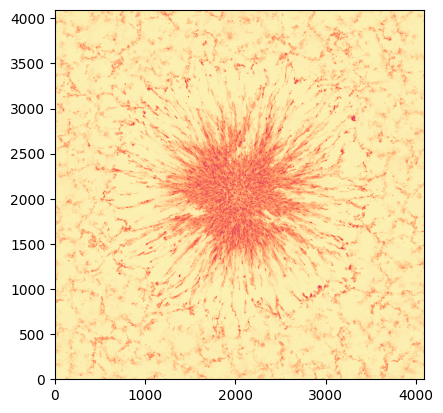

In [22]:
plt.imshow(data1[:,:,0].T,origin='lower',cmap='magma')

In [27]:
nx, ny, nz = data1.shape


b = np.zeros((int(nx/4),int(ny/4),nz))
for i in range(256):
    b[:,:,i] = np.sum(data1[:,:,i].reshape(int(nx/4),4,int(ny/4),4),axis=(1,3))/16.0
b.shape

(1024, 1024, 256)

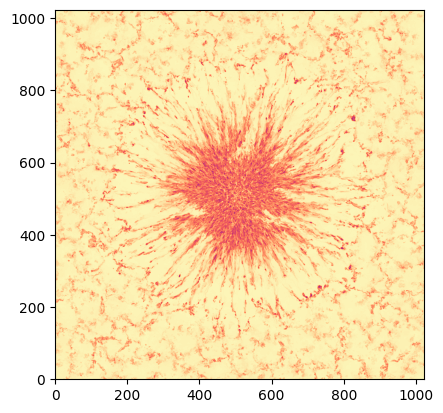

In [28]:
plt.imshow(b[:,:,0].T,origin='lower',cmap='magma')

In [29]:
np.std(b)

4511.562863693813

In [31]:
filepath = "/dat/schmassmann/rempel/spot_12x8x12km_ng/temp.float"

In [36]:
filepath[42:-6]

'temp'

In [ ]:
hdu = fits.PrimaryHDU(b)
hdu.writeto("/dat/xenosh/Full_simulation/"+filepath[42:-6]+"_bin.fits", overwrite = True)

In [8]:
temp = fits.open("/dat/xenosh/Full_simulation/temp_bin.fits")[0].data
temp.shape

(1024, 1024, 256)

In [43]:
4096*12

49152

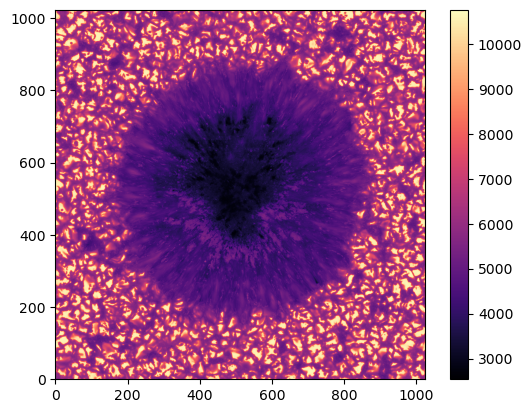

In [55]:
plt.imshow(temp[:,:,161].T,origin='lower',cmap='magma')
plt.colorbar()

In [49]:
z = np.arange(256)

In [14]:
Tmean = np.mean(temp,axis=(0,1))
Tmean.shape

(256,)

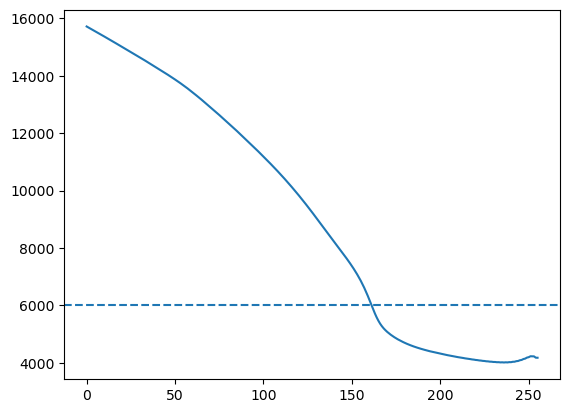

In [53]:
plt.plot(z, Tmean)
#plt.xlabel("height[km]")
#plt.ylabel("Temperature")
plt.axhline(6000,linestyle='--')

In [47]:
a = np.where(Tmean[:] < 6000)
a = np.asarray(a)
a

array([[162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174,
        175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187,
        188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200,
        201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213,
        214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226,
        227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239,
        240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252,
        253, 254, 255]])

In [71]:
B2 = fits.open("/dat/xenosh/Full_simulation/magy_bin.fits")[0].data
B2.shape

(1024, 1024, 256)

In [72]:
B3 = fits.open("/dat/xenosh/Full_simulation/magz_bin.fits")[0].data
B3.shape

(1024, 1024, 256)

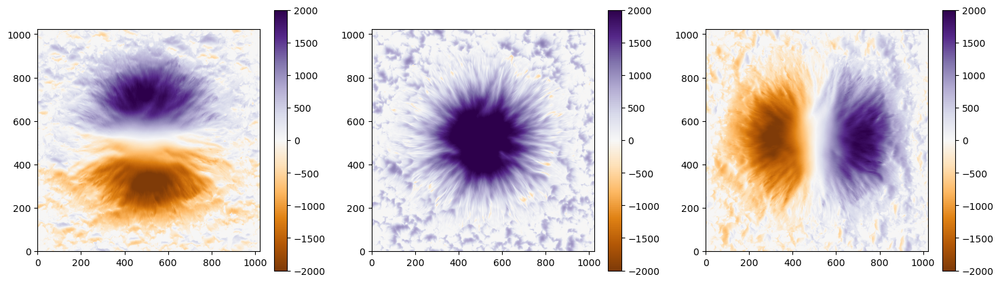

In [93]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(B1[:,:,201].T,origin='lower',cmap='PuOr',vmin=-2000,vmax=2000)
plt.colorbar()
plt.subplot(132)
plt.imshow(B2[:,:,201].T,origin='lower',cmap='PuOr',vmin=-2000,vmax=2000)
plt.colorbar()
plt.subplot(133)
plt.imshow(B3[:,:,201].T,origin='lower',cmap='PuOr',vmin=-2000,vmax=2000)
plt.colorbar()


In [68]:
B1 = fits.open("/dat/xenosh/Full_simulation/magx_bin.fits")[0].data
B1.shape

(1024, 1024, 256)

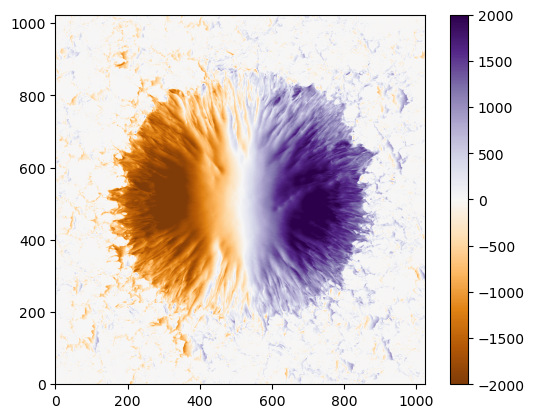

In [80]:
plt.imshow(B1[:,:,161],origin='lower',cmap='PuOr',vmin=-2000,vmax=2000)
plt.colorbar()

In [3]:
V1 = fits.open("/dat-old/xenosh/Full_simulation/velx_bin.fits")[0].data
V2 = fits.open("/dat-old/xenosh/Full_simulation/vely_bin.fits")[0].data
V3 = fits.open("/dat-old/xenosh/Full_simulation/velz_bin.fits")[0].data


In [4]:
V1 /= 1e6 
V2 /= 1e6 
V3 /= 1e6 

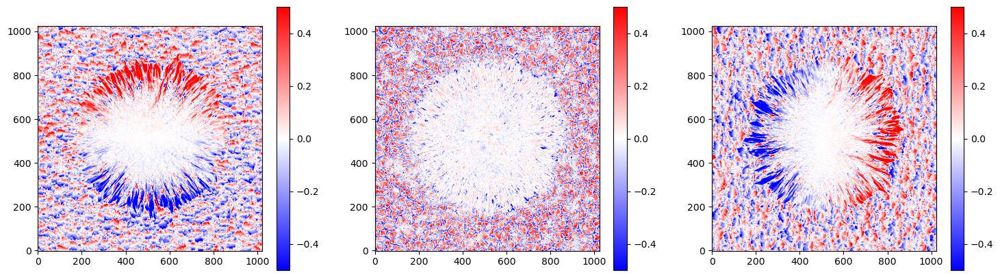

In [5]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(V1[:,:,161].T,origin='lower',cmap='bwr',vmin=-0.5,vmax=0.5)
plt.colorbar()
plt.subplot(132)
plt.imshow(V2[:,:,161].T,origin='lower',cmap='bwr',vmin=-0.5,vmax=0.5)
plt.colorbar()
plt.subplot(133)
plt.imshow(V3[:,:,161].T,origin='lower',cmap='bwr',vmin=-0.5,vmax=0.5)
plt.colorbar()

In [85]:
pres = fits.open("/dat/xenosh/Full_simulation/pres_bin2x2.fits")[0].data

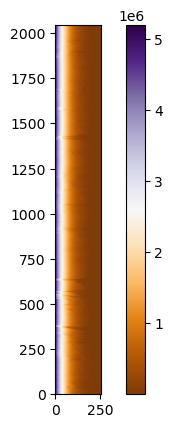

In [89]:
plt.imshow(pres[:,2000,:],origin='lower',cmap='PuOr')
plt.colorbar()

## poynting flux

$S_z = \frac{1}{4 \pi}[v_z B^2_h - (v_h \cdot \bm{B_h})B_z] = \frac{1}{4 \pi}[v_z B^2_h -(v_x*B_x +v_y*B_y)B_z] $

In [45]:
Sz = (vz*(Bx**2+By**2) - (vx*Bx+vy*By)*Bz )/4/np.pi

In [18]:
Sz.shape

(1536, 1536, 1056)

Text(0.5, 1.0, '$S_z$')

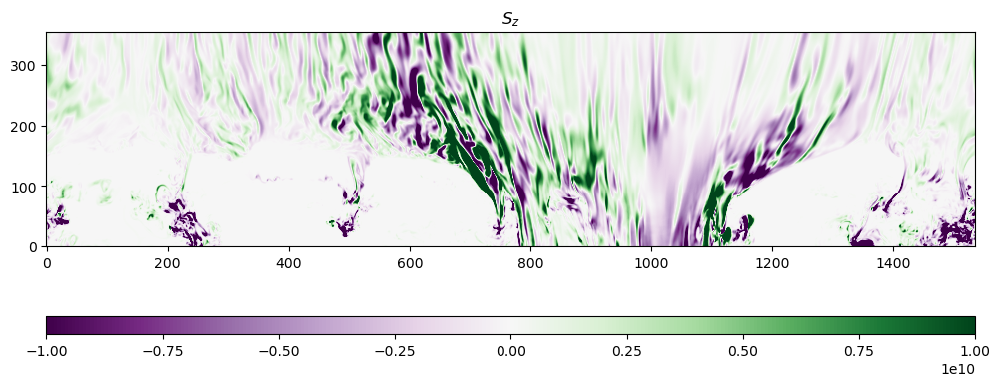

In [37]:
plt.figure(figsize=(12,6))
plt.imshow(Sz[:,1100,700:].T,origin='lower',cmap='PRGn',vmin=-1e10,vmax=1e10)
plt.colorbar(location='bottom',aspect=50)
plt.title(r'$S_z$')

Text(0.5, 1.0, '$S_z$')

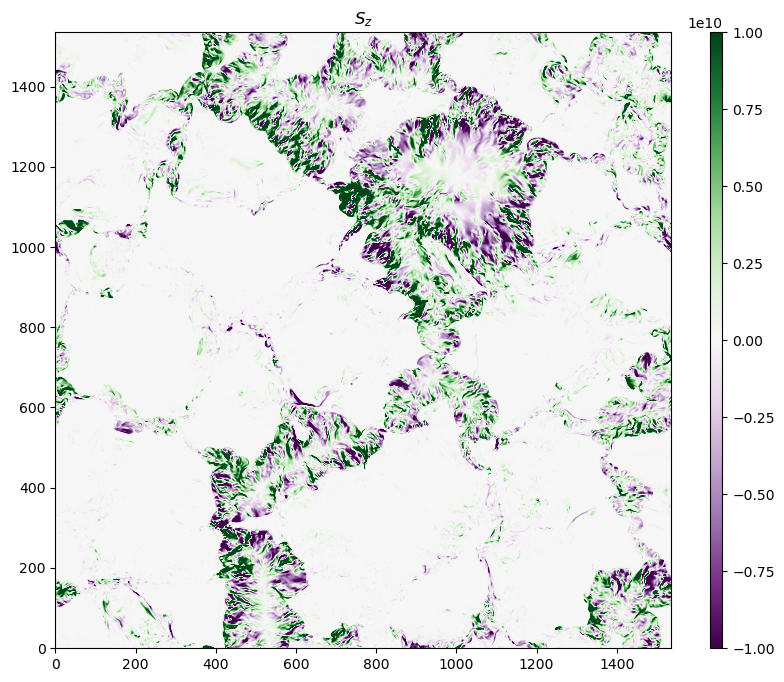

In [40]:
plt.figure(figsize=(10,8))
plt.imshow(Sz[:,:,810].T,origin='lower',cmap='PRGn',vmin=-1e10,vmax=1e10)
plt.colorbar(aspect=50)
plt.title(r'$S_z$')

Text(0.5, 1.0, '$S_z$')

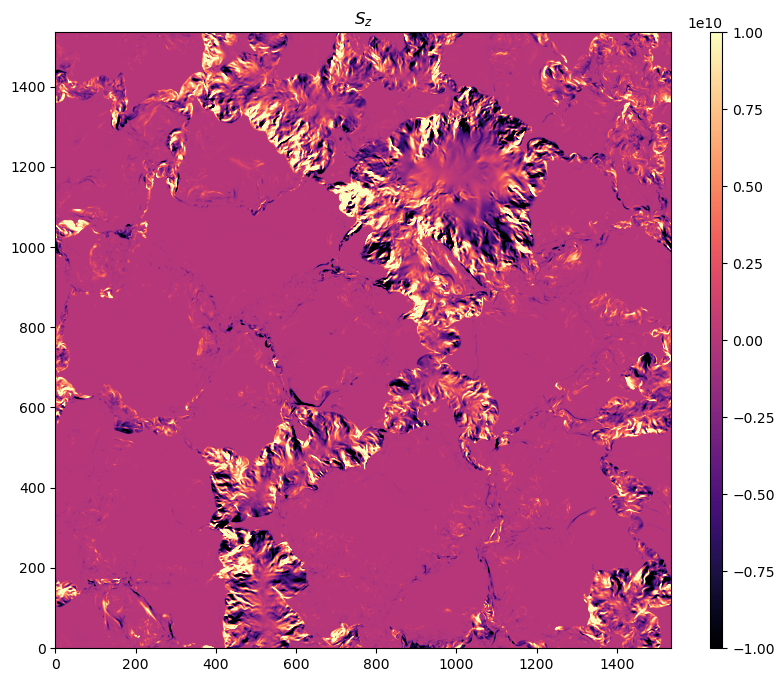

In [46]:
plt.figure(figsize=(10,8))
plt.imshow(Sz[:,:,810].T,origin='lower',cmap='magma',vmin=-1e10,vmax=1e10)
plt.colorbar(aspect=50)
plt.title(r'$S_z$')

(700.0, 940.0)

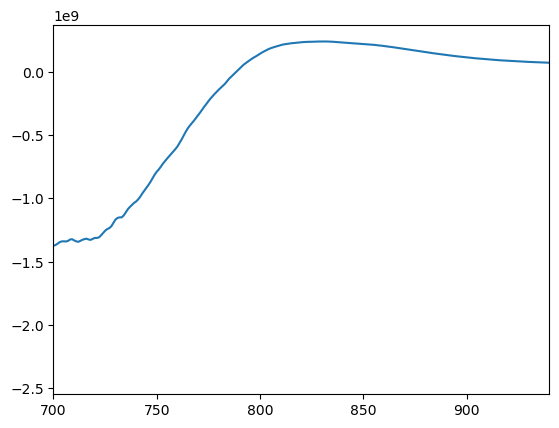

In [47]:
plt.plot(np.mean(Sz,axis=(0,1)),label='whole fov')
plt.xlim([700,940])